In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import StandardScaler
from src.data_preparation.data_preparation import DataPreparation
from src.main_scripts.implemented import Implementations
from src.main_scripts.ML_implemented import ML_implemented

In [2]:
analysis = Implementations(name_column='BomanIndex',
                               new_columns=['Cysteines', 'Asphartic Acid', 'Small_aminoacids'],
                               count_amins=[['C', ], ['D'], ['G', 'L']],
                               rel_col='Length',
                               norm_cols=0)
prep = analysis.prep
machinelern = ML_implemented(analysis.name_column)


In [3]:
dataset = pd.read_excel('./databases/AMP_30_03_2020_IMPROVED.xlsx', index_col=0)

In [4]:
dataset

,ID,Name/Class,Source,Kingdom,"Celularity (Sing, Mult)","Tissue (Yes, No)","Mesoderm (Yes, NO)",Mouthparts(Pro-Deuter),Phyllum,Class,...,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_class,seq_mweight,seq_pi,Radius_gyration
Kolumna1,,,,,,,,,,,,,,,,,,,,,
0,AP00001,Dermaseptin-B2,"Giant leaf frog,",A,MUL,YES,YES,DEU,CHOR,AMPH,...,-0.373333,0.023333,-0.189091,-0.737273,0.112727,0.172424,Globular/Surface,3181.72634,10.502974,55.8820
1,AP00002,Abaecin,"honeybee, Apis mellifera",A,MUL,YES,YES,PRO,ARTH,HEX,...,0.139118,-0.252059,0.348529,-0.335294,0.408824,-0.308529,Globular,3878.49684,10.965017,29.9370
2,AP00003,Hs-AFP1,Heuchera sanguinea,A,MUL,YES,YES,PRO,ARTH,CHEL,...,-0.024259,0.241667,0.058519,0.087407,0.126481,-0.032593,Globular,5948.70564,8.213678,45.7830
3,AP00004,Ct-AMP1,Clitoria ternatea,P,MUL,NOT,NOT,NOT,ANGIO,DIC,...,0.071224,0.190408,-0.225306,0.301429,0.304898,0.138571,Globular,5614.25194,7.989076,31.0235
4,AP00005,Andropin,"Fruit fly, Drosophila melanogaster",A,MUL,YES,YES,PRO,ARTH,HEX,...,0.301471,-0.302941,0.045588,-0.462353,-0.018529,0.268824,Surface/Globular,3750.39884,7.547250,52.7405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2712,DRAMP18722,MA (Magainin 2 (9-21) truncated peptide),Xenopus laevis (African clawed frog),A,MUL,YES,YES,DEU,CHOR,AMPH,...,-0.180000,-0.007692,0.311538,-0.547692,0.417692,0.583077,Globular,1425.75224,10.506902,51.3330
5248,DRAMP18723,CE Cecropin A,Hyalophora cecropia (Cecropia moth),A,MUL,YES,YES,PRO,ARTH,HEX,...,-0.175000,0.063750,0.516250,-1.092500,0.615000,0.016250,Globular,1090.42024,11.278354,0.0000
5856,DRAMP18724,"Oncorhyncin III (Oncorhyncin-3, histone-derive...",Oncorhynchus mykiss (Rainbow trout) (Salmo gai...,A,MUL,YES,YES,DEU,CHOR,PISC,...,-0.113623,0.053043,-0.019130,-0.626232,0.240725,-0.108551,Globular,6956.03724,11.507281,94.6700


In [5]:
dataset.columns

Index(['ID', 'Name/Class', 'Source', 'Kingdom', 'Celularity (Sing, Mult)',
       'Tissue (Yes, No)', 'Mesoderm (Yes, NO)', 'Mouthparts(Pro-Deuter)',
       'Phyllum', 'Class', 'Age Tre of life', 'Sequence',
       'Hydrophobic_residue', 'Length', 'Net_charge', 'BomanIndex', 'Activity',
       'Abrev.', 'A_BACT', 'A_CANCER', 'A_VIRAL', 'A_FUNGAL', 'RANGE',
       'insta_index', 'Aliphatic', 'Aromatic', 'NonPolar', 'Polar', 'Charged',
       'Basic', 'Acidic', 'polarity', 'h_bonding', 'alfa_turn_prop',
       'bulky_prop', 'local_flex', 'electronic_prop', 'comp_char', 'seq_hydro',
       'helix_bend_pref', 'side_chain_size', 'pk_c', 'surro_hydro',
       'd_bend_pref', 'spec_vol', 'flat_pref', 'occ_alpha', 'seq_class',
       'seq_mweight', 'seq_pi', 'Radius_gyration'],
      dtype='object')

In [6]:
dataset.describe()

,Age Tre of life,Hydrophobic_residue,Length,Net_charge,BomanIndex,insta_index,Aliphatic,Aromatic,NonPolar,Polar,...,side_chain_size,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_mweight,seq_pi,Radius_gyration
count,2.367000e+03,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6542.000000,6545.000000,6545.000000,6545.000000,...,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000
mean,5.137828e+08,0.504010,35.687395,3.675172,0.987241,29.868777,9.474320,3.603972,21.022918,14.635905,...,-0.284320,-0.009288,0.105609,-0.061188,-0.271617,0.238328,0.036696,3909.572169,9.053103,42.340162
std,5.479458e+08,0.158014,20.708672,3.583859,1.626739,27.304607,5.994075,3.016091,11.442295,10.685057,...,0.267344,0.232058,0.210962,0.209612,0.392956,0.237271,0.284890,2308.908623,2.127515,46.521906
min,0.000000e+00,0.000000,2.000000,-20.000000,-3.823333,-43.433333,0.000000,0.000000,0.000000,0.000000,...,-1.458333,-1.485000,-0.882727,-1.200000,-1.616364,-1.520000,-1.522000,260.290140,2.602637,0.000000
25%,2.700000e+08,0.384615,21.000000,1.000000,-0.023333,10.266000,6.000000,2.000000,13.000000,7.000000,...,-0.457027,-0.150645,-0.022143,-0.178182,-0.562222,0.097143,-0.124737,2209.791240,8.111385,17.649500
50%,2.700000e+08,0.487805,31.000000,3.000000,0.980000,27.131884,9.000000,3.000000,19.000000,12.000000,...,-0.295132,0.000303,0.111333,-0.057059,-0.288605,0.242899,0.025684,3275.921240,9.537301,33.649500
75%,4.600000e+08,0.617647,45.000000,6.000000,1.967027,45.139474,12.000000,5.000000,26.000000,20.000000,...,-0.127500,0.138333,0.234643,0.061250,0.044419,0.388235,0.201429,4939.982940,10.512673,51.676500
max,3.800000e+09,1.000000,174.000000,30.000000,40.433333,305.690323,42.000000,27.000000,130.000000,82.000000,...,1.498333,1.115000,1.043333,1.183333,1.165833,1.142727,1.797632,19198.367240,13.932011,840.744000


In [7]:
dataset.drop(columns=['Age Tre of life'])
kolo = pd.DataFrame(dict(map(lambda x: (x,stats.kstest(dataset[x], stats.norm.cdf, alternative='less')), prep.get_cechy(dataset))), index=['statistic', 'pvalue']).T
kolo

,statistic,pvalue
Age Tre of life,NaN,NaN
Hydrophobic_residue,0.567502,0.000000e+00
Length,0.999816,0.000000e+00
Net_charge,0.719649,0.000000e+00
BomanIndex,0.338489,0.000000e+00
insta_index,0.858267,0.000000e+00
Aliphatic,NaN,NaN
Aromatic,0.751352,0.000000e+00
NonPolar,0.996358,0.000000e+00
Polar,0.966096,0.000000e+00


/home/arjissuan/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


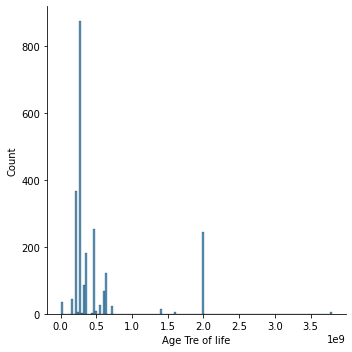

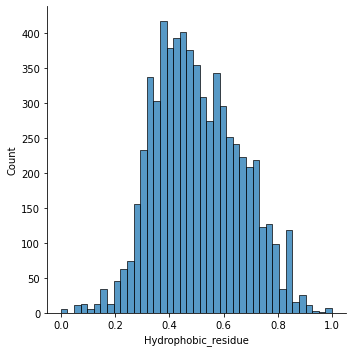

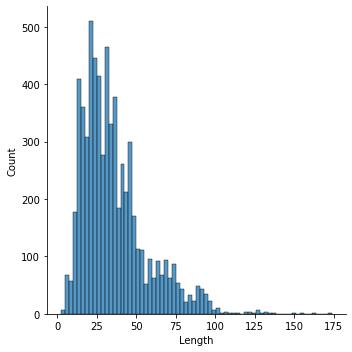

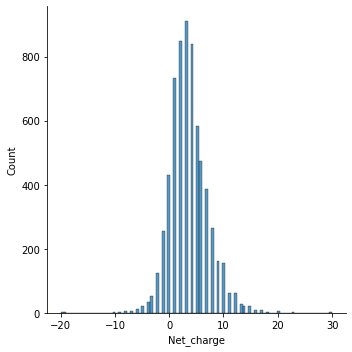

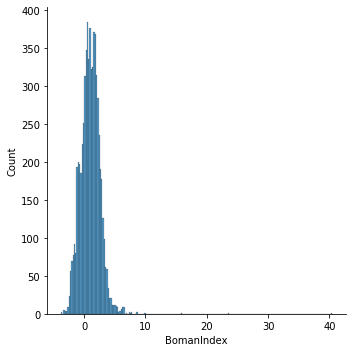

...

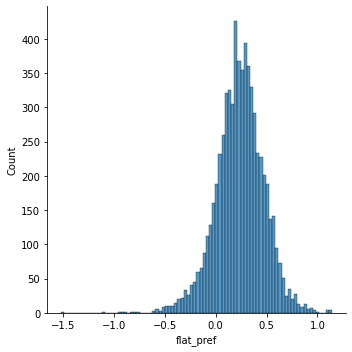

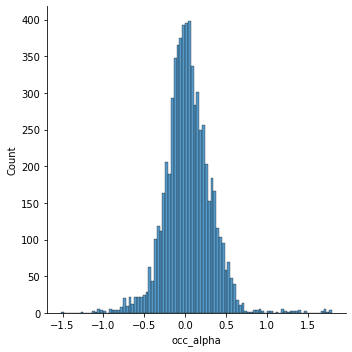

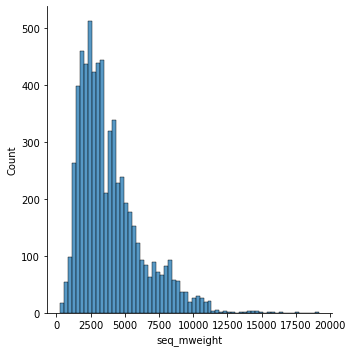

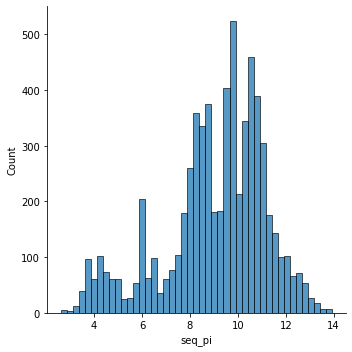

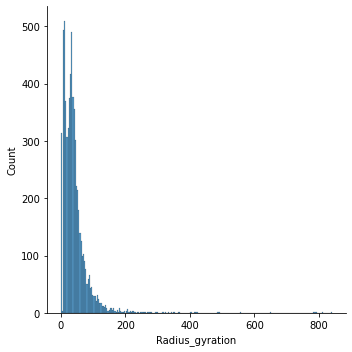

In [8]:
columny = dataset.describe()
columny = columny.columns
for col in columny:
    sns.displot(dataset[col])

<AxesSubplot:>

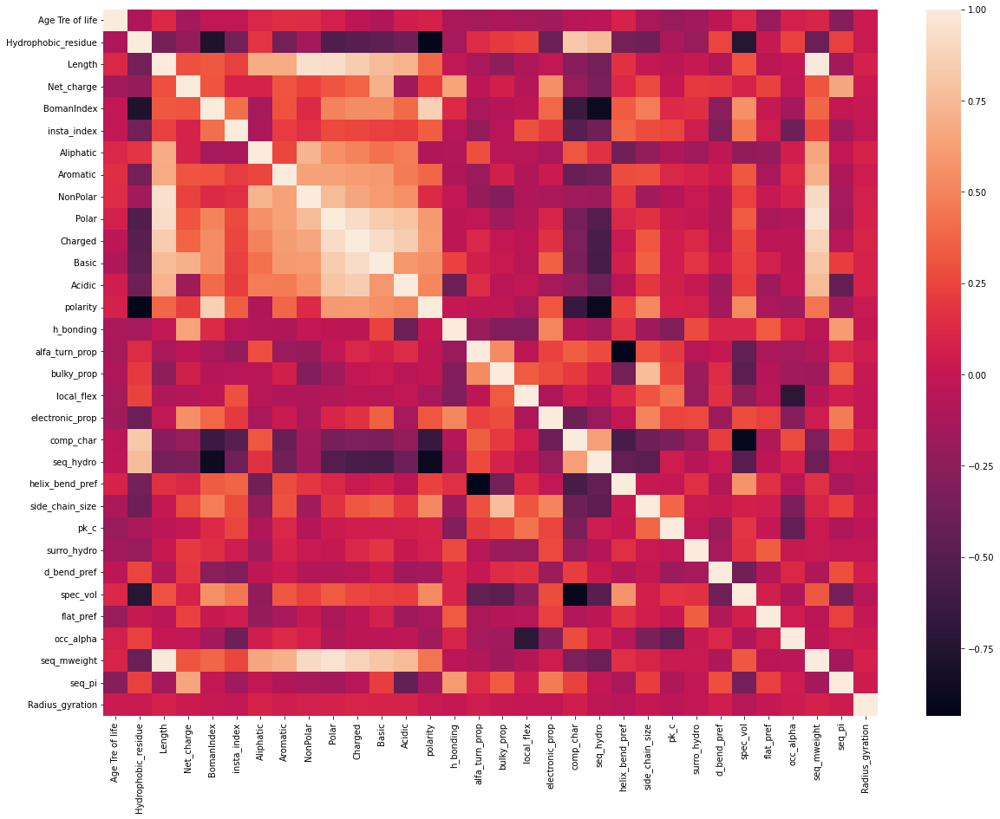

In [9]:
corrmat = dataset.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corrmat)

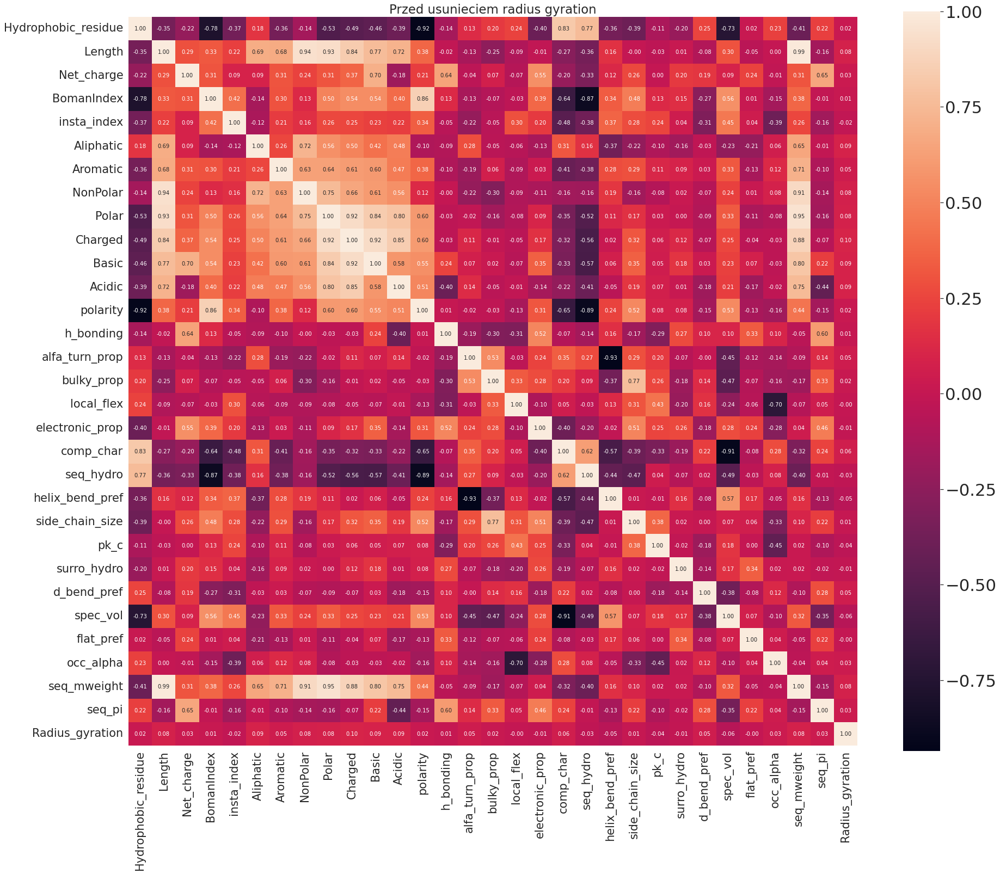

In [17]:
# wykonanie tego samego przy uzyciu funkcji numpy(nie maskuje ona automatycznie wartosci None)
prep.heatmaps(prep.correlation(dataset.drop(columns=['Age Tre of life'], axis=1)),
              cechy=prep.get_cechy(dataset.drop(columns=['Age Tre of life'], axis=1)) ,
              title='Przed usunieciem radius gyration', 
              size=(30,25), 
              font_scale=2.8, 
              fmt='.2f',
              annota=10,
              save=True)

In [10]:
# i=0
# gf = dataset.drop(columns=['Age Tre of life'], axis=1)
# while i <= len(prep.get_cechy(gf)):
#         j=i
#         i+=6
#         current = list(prep.get_cechy(gf)[z] for z in range(j, i) if z <= len(prep.get_cechy(gf))-1)
#         print(current)
#         gf.hist(column=current,
#                    bins=40, 
#                    color='steelblue', 
#                    edgecolor='black', 
#                    figsize=[12, 12], 
#                    linewidth=1.0, 
#                    xlabelsize=8,
#                    ylabelsize=8, 
#                    grid=True)  
#         plt.savefig(f'./figures/histogram{j,i}')

<AxesSubplot:>

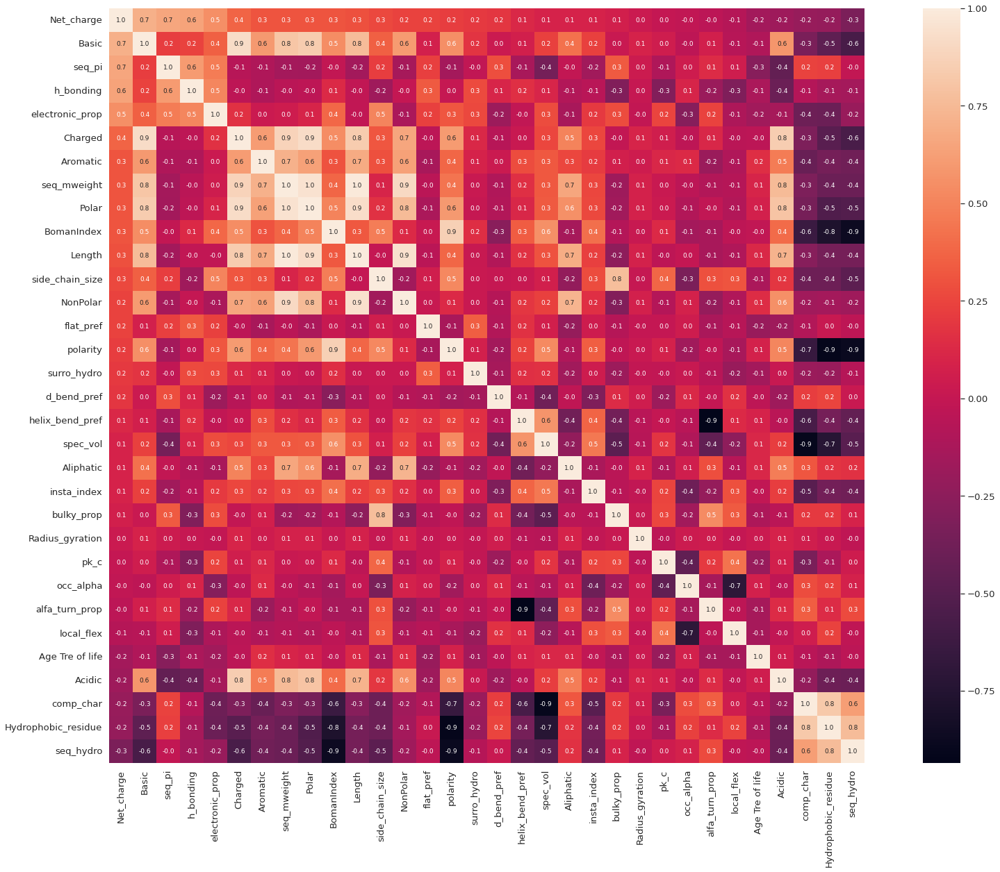

In [18]:
# uszeregowanie najmocniejszych do najslabszych korelacji do net_charge
k=100
corr_to_net = corrmat.nlargest(k, 'Net_charge')['Net_charge']

values = dataset[corr_to_net.index].values.T
corr = np.ma.corrcoef(np.ma.masked_invalid(values))
sns.set(font_scale=1.2 )
plt.figure(figsize=(30,20))
sns.heatmap(corr, cbar=True, annot=True, square=True, fmt='.1f', annot_kws={'size':9}, yticklabels=corr_to_net.index, xticklabels=corr_to_net.index)



In [19]:
#zagubione dane
total = dataset.isnull().sum().sort_values(ascending=False)
percent = (dataset.isnull().sum()/dataset.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.to_excel('./databases/wyniki/brakujace_wyniki.xlsx')
missing

,Total,Percent
Age Tre of life,4178,0.638350
Abrev.,4178,0.638350
polarity,76,0.011612
h_bonding,76,0.011612
Aliphatic,3,0.000458
ID,0,0.000000
seq_hydro,0,0.000000
Basic,0,0.000000
Acidic,0,0.000000
alfa_turn_prop,0,0.000000


In [20]:
#analysis.clasterization_results(df=prep.get_dataset(),size=(30,25), font_scale=2.9, fmt='.2f', annota=13)

In [21]:
# for indx, col in enumerate(prep.clst_columns):
#     df = prep.clsterization(indx, prep.get_dataset())
#     auto_lengths = lambda x: (x, len(df[x]))
#     clasters_leng = dict(map(auto_lengths, df.keys()))
#     print(clasters_leng)

In [22]:
choosen = prep.get_dataset()
choosen = prep.mask_nans(choosen)

In [23]:
choosen.describe()

,Hydrophobic_residue,Length,Net_charge,BomanIndex,insta_index,Aliphatic,Aromatic,NonPolar,Polar,Charged,...,helix_bend_pref,side_chain_size,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_mweight,seq_pi
count,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,...,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000
mean,0.504767,35.803588,3.697495,0.972671,29.845489,9.511908,3.613981,21.105011,14.692236,8.466131,...,-0.004478,-0.284855,-0.008812,0.106831,-0.061028,-0.272420,0.239621,0.036370,3924.911303,9.067308
std,0.157836,20.753093,3.583029,1.517057,27.326745,5.997622,3.025964,11.452432,10.710459,6.672323,...,0.295901,0.266146,0.231340,0.210304,0.209311,0.394163,0.236759,0.284457,2313.283382,2.114050
min,0.000000,2.000000,-20.000000,-3.823333,-43.433333,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.245000,-1.458333,-1.485000,-0.882727,-1.200000,-1.616364,-1.520000,-1.522000,260.290140,2.602637
25%,0.384615,21.000000,1.000000,-0.034833,10.210307,6.000000,2.000000,14.000000,7.000000,4.000000,...,-0.217197,-0.457051,-0.149965,-0.020000,-0.177778,-0.564636,0.098684,-0.124708,2230.800865,8.115313
50%,0.488372,31.000000,3.000000,0.975300,27.119737,9.000000,3.000000,19.000000,12.000000,7.000000,...,-0.033667,-0.296138,0.000591,0.112424,-0.056940,-0.290806,0.243226,0.025385,3285.759640,9.537301
75%,0.619048,45.000000,6.000000,1.961481,45.156250,12.000000,5.000000,26.000000,20.000000,12.000000,...,0.185709,-0.128571,0.138333,0.235485,0.061250,0.044800,0.390000,0.200000,4966.619465,10.512673
max,1.000000,174.000000,30.000000,9.814839,305.690323,42.000000,27.000000,130.000000,82.000000,46.000000,...,1.513333,1.498333,1.115000,1.043333,1.183333,1.165833,1.142727,1.797632,19198.367240,13.932011


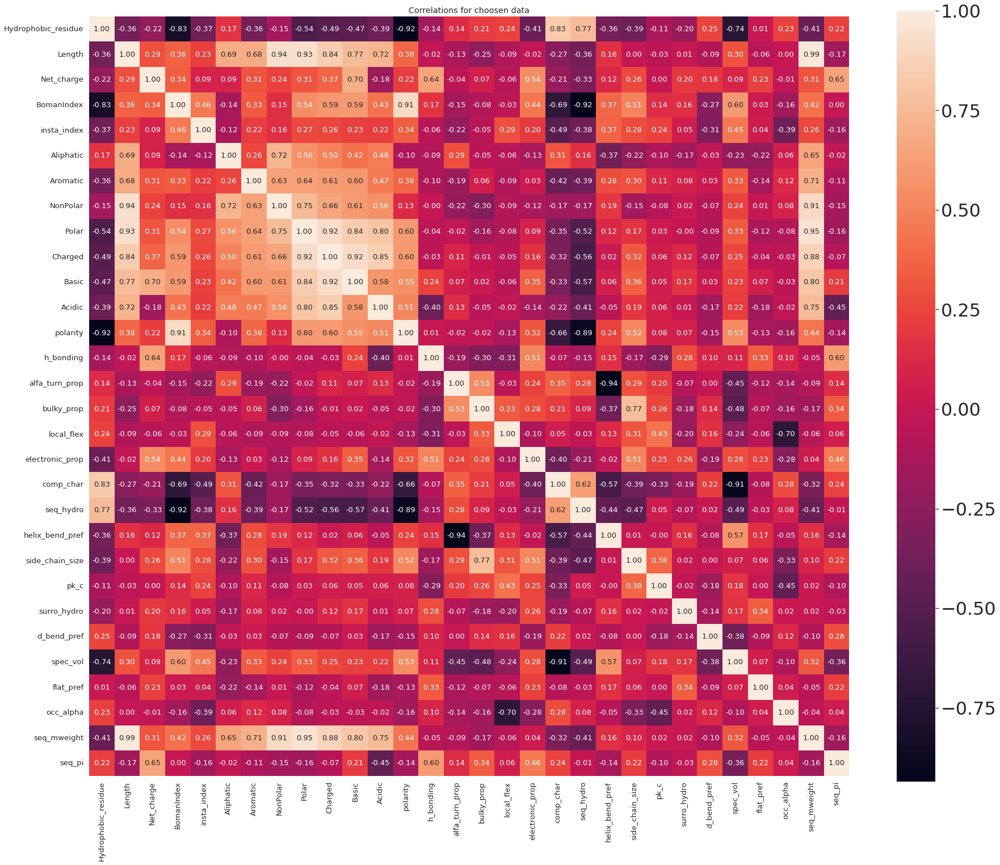

In [24]:
corr_chosen = prep.correlation(choosen)
prep.heatmaps(corr_chosen,
              cechy=prep.get_cechy(choosen) ,
              title='Correlations for choosen data', 
              size=(30,25), 
              font_scale=2.9, 
              fmt='.2f',
              annota=13)

In [25]:
# analysis.clasterization_results(df=choosen,size=(30,25), font_scale=2.9, fmt='.2f', annota=13)

In [26]:
# for indx, item in enumerate(prep.clst_columns):
#     df = prep.clsterization(indx, choosen)
#     auto_lengths = lambda x: (x, len(df[x]))
#     clasters_leng = dict(map(auto_lengths, df.keys()))
#     print(clasters_leng)
    

In [27]:
"""Boman Index analasis part/ normalized data analasis"""

normal_df = analysis.dataframe_preparation(prep.get_dataset(), 
                                           ['Cysteines','Asphartic Acids', 'Small_aminoacids'], 
                                           [['C',],['D'], ['G', 'L']],
                                           'Length'
                                          )
normal_df

,Cysteines,Asphartic Acids,Small_aminoacids,Aliphatic,Aromatic,NonPolar,Polar,Charged,Basic,Acidic,...,side_chain_size,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_class,seq_mweight,seq_pi
0,0.000000,0.000000,18.181818,51.515152,3.030303,66.666667,33.333333,27.272727,18.181818,9.090909,...,-0.699091,-0.373333,0.023333,-0.189091,-0.737273,0.112727,0.172424,Globular/Surface,3181.72634,10.502974
1,0.000000,0.000000,14.705882,11.764706,17.647059,70.588235,29.411765,11.764706,11.764706,0.000000,...,-0.019412,0.139118,-0.252059,0.348529,-0.335294,0.408824,-0.308529,Globular,3878.49684,10.965017
2,14.814815,5.555556,12.962963,11.111111,16.666667,51.851852,48.148148,25.925926,18.518519,7.407407,...,-0.307037,-0.024259,0.241667,0.058519,0.087407,0.126481,-0.032593,Globular,5948.70564,8.213678
3,16.326531,4.081633,14.285714,10.204082,18.367347,48.979592,51.020408,26.530612,18.367347,8.163265,...,-0.193673,0.071224,0.190408,-0.225306,0.301429,0.304898,0.138571,Globular,5614.25194,7.989076
4,0.000000,5.882353,11.764706,41.176471,11.764706,61.764706,38.235294,26.470588,14.705882,11.764706,...,-0.220000,0.301471,-0.302941,0.045588,-0.462353,-0.018529,0.268824,Surface/Globular,3750.39884,7.547250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6461,0.000000,0.000000,15.384615,30.769231,15.384615,69.230769,30.769231,30.769231,23.076923,7.692308,...,-0.256923,-0.180000,-0.007692,0.311538,-0.547692,0.417692,0.583077,Globular,1425.75224,10.506902
6462,0.000000,0.000000,12.500000,25.000000,25.000000,50.000000,50.000000,50.000000,50.000000,0.000000,...,0.775000,-0.175000,0.063750,0.516250,-1.092500,0.615000,0.016250,Globular,1090.42024,11.278354
6463,0.000000,4.347826,10.144928,33.333333,0.000000,52.173913,47.826087,37.681159,28.985507,8.695652,...,-0.481304,-0.113623,0.053043,-0.019130,-0.626232,0.240725,-0.108551,Globular,6956.03724,11.507281
6464,2.631579,0.000000,18.421053,44.736842,2.631579,71.052632,28.947368,0.000000,0.000000,0.000000,...,-0.650789,0.082895,-0.423421,0.022895,-0.310789,0.019474,-0.039474,Globular/Transmembrane,3745.35174,5.922539


In [28]:
#analysis.normalized_df

In [29]:
normal_df[normal_df.Cysteines == 50].Sequence

4606    SCTTCECCCSCS
6194    SCNCVCGVCCSC
Name: Sequence, dtype: object

In [30]:
normal_df.describe()

,Cysteines,Asphartic Acids,Small_aminoacids,Aliphatic,Aromatic,NonPolar,Polar,Charged,Basic,Acidic,...,helix_bend_pref,side_chain_size,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_mweight,seq_pi
count,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,...,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000
mean,7.036117,2.668734,20.268889,29.225615,10.395516,61.321849,38.651097,22.415682,16.860866,5.554816,...,-0.004478,-0.284855,-0.008812,0.106831,-0.061028,-0.272420,0.239621,0.036370,3924.911303,9.067308
std,7.631361,4.011159,11.807784,14.299235,7.301417,11.831839,11.829216,10.635185,8.675230,6.263796,...,0.295901,0.266146,0.231340,0.210304,0.209311,0.394163,0.236759,0.284457,2313.283382,2.114050
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.245000,-1.458333,-1.485000,-0.882727,-1.200000,-1.616364,-1.520000,-1.522000,260.290140,2.602637
25%,0.000000,0.000000,12.500000,17.391304,5.714286,53.846154,30.952381,15.384615,11.538462,0.000000,...,-0.217197,-0.457051,-0.149965,-0.020000,-0.177778,-0.564636,0.098684,-0.124708,2230.800865,8.115313
50%,5.405405,1.666667,17.857143,28.571429,9.302326,60.606061,39.393939,21.739130,16.216216,4.347826,...,-0.033667,-0.296138,0.000591,0.112424,-0.056940,-0.290806,0.243226,0.025385,3285.759640,9.537301
75%,13.043478,4.444444,25.000000,40.000000,14.000000,68.965517,46.153846,28.888889,21.212121,8.333333,...,0.185709,-0.128571,0.138333,0.235485,0.061250,0.044800,0.390000,0.200000,4966.619465,10.512673
max,50.000000,100.000000,95.454545,83.333333,87.500000,100.000000,100.000000,100.000000,66.666667,100.000000,...,1.513333,1.498333,1.115000,1.043333,1.183333,1.165833,1.142727,1.797632,19198.367240,13.932011


In [31]:
#kolgomorowa test+histogramy ze to ma rozklad normalny i mozna wrzucac
kolo_gooddata = pd.DataFrame(dict(map(lambda x: (x,stats.kstest(normal_df[x], stats.norm.cdf, alternative='less')), prep.get_cechy(normal_df))), index=['statistic', 'pvalue']).T
kolo_gooddata.to_excel('./databases/wyniki/kologomorow_gotowy_dataset.xlsx')
kolo_gooddata

,statistic,pvalue
Cysteines,0.565073,0.000000e+00
Asphartic Acids,0.500000,0.000000e+00
Small_aminoacids,0.974936,0.000000e+00
Aliphatic,0.983691,0.000000e+00
Aromatic,0.895539,0.000000e+00
NonPolar,0.999691,0.000000e+00
Polar,0.996286,0.000000e+00
Charged,0.978692,0.000000e+00
Basic,0.958591,0.000000e+00
Acidic,0.662870,0.000000e+00


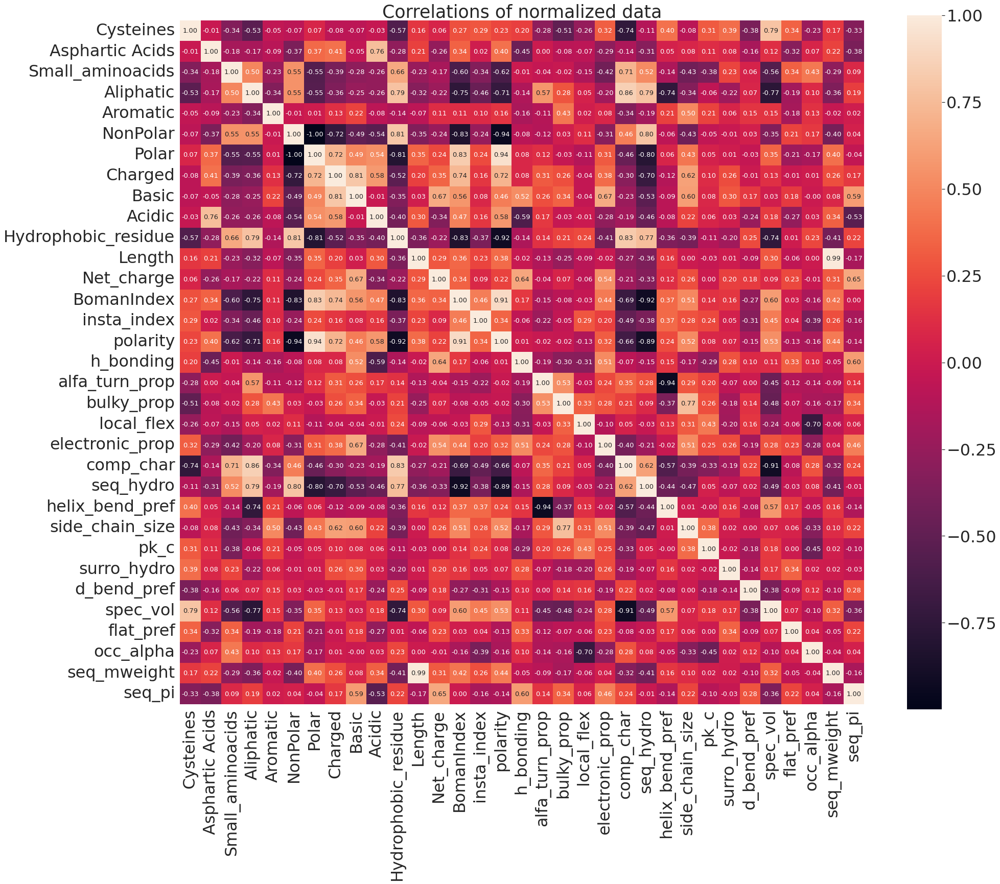

In [32]:
prep.heatmaps(corld_df=prep.correlation(normal_df),
              cechy=prep.get_cechy(normal_df), 
              title='Correlations of normalized data',
              size=(30,25),
              font_scale=2.9, 
              fmt='.2f',
              annota=13,
             save=True)

In [33]:
#analysis.clasterization_results(df=normal_df,size=(30,25), font_scale=2.9, fmt='.2f', annota=13, save=True)

5516


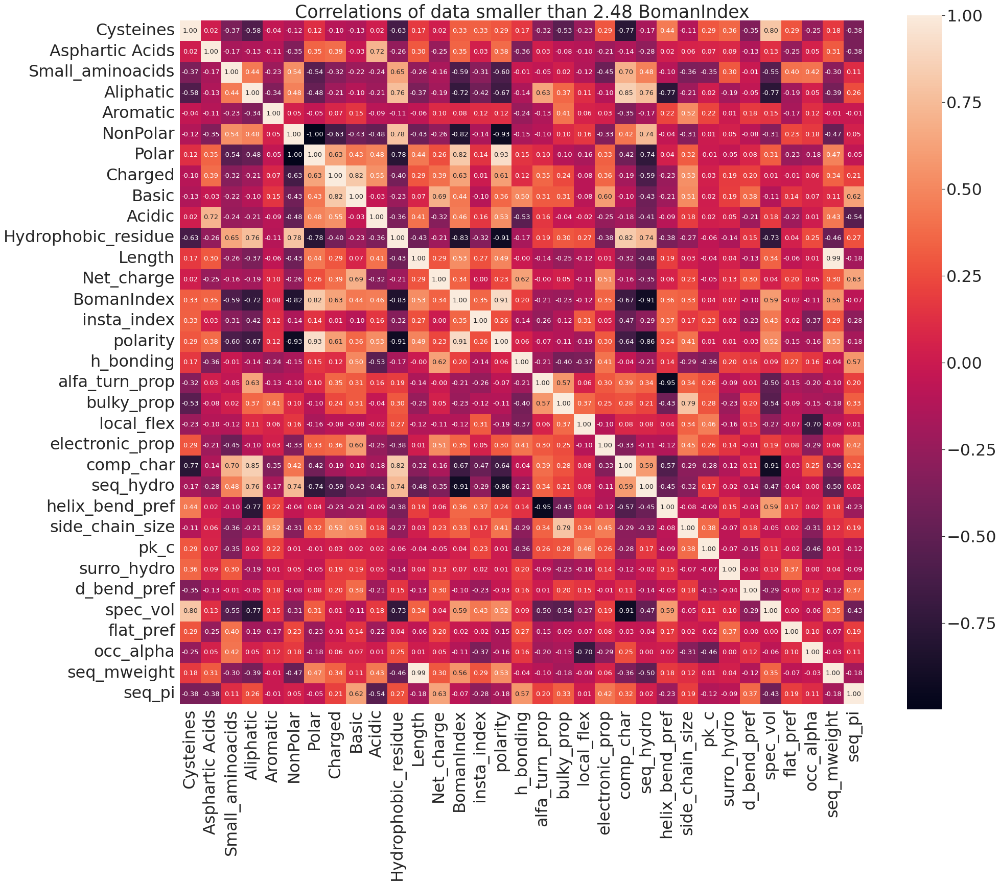

In [36]:
less_zero = normal_df[normal_df.BomanIndex <= 2.48]
print(len(less_zero))
prep.heatmaps(prep.correlation(less_zero), 
              cechy=prep.get_cechy(less_zero),
              title='Correlations of data smaller than 2.48 BomanIndex',
              size=(30,25),
              font_scale=2.9, 
              fmt='.2f',
              annota=13,
             save=False)
             

950


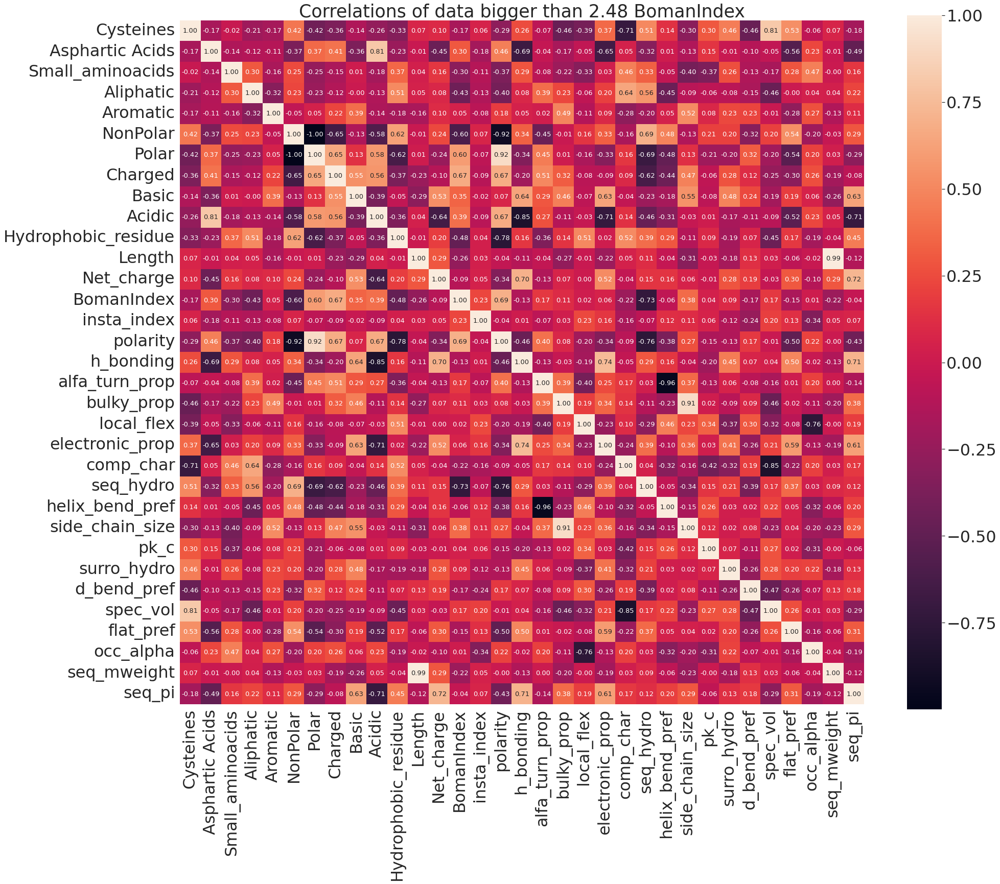

In [37]:
more_than_zero = normal_df[normal_df.BomanIndex > 2.48]
print(len(more_than_zero))
prep.heatmaps(prep.correlation(more_than_zero), 
             cechy=prep.get_cechy(more_than_zero),
             title='Correlations of data bigger than 2.48 BomanIndex',
              size=(30,25),
              font_scale=2.9, 
              fmt='.2f',
              annota=13,
             save=True)


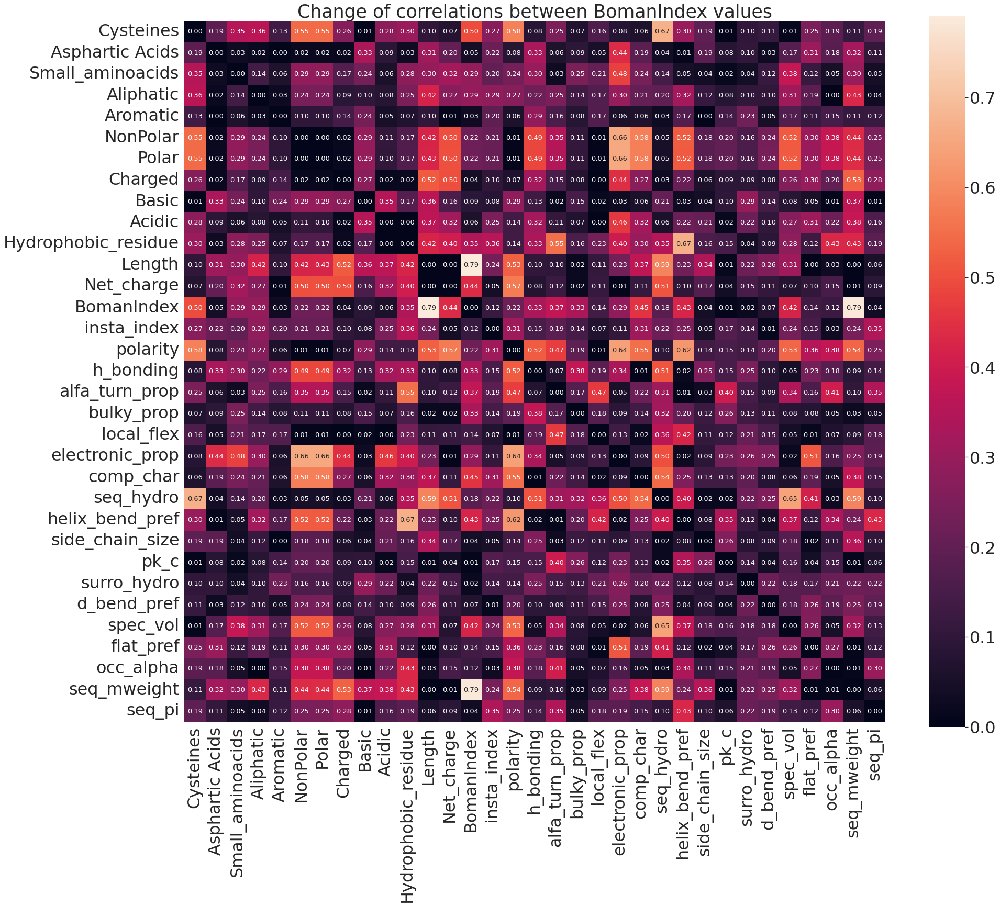

In [38]:
# value change between
# change the scale becaues now its not readble 
diffrented = ((prep.correlation(less_zero)-prep.correlation(more_than_zero))**2)**(1/2)
prep.heatmaps(diffrented,
             cechy=prep.get_cechy(more_than_zero),
             title='Change of correlations between BomanIndex values',
             size=(30,25),
             font_scale=2.9,
             fmt='.2f',
             annota=13,
             save=True)

In [48]:
# statystyki odnosnie aminokwasow
aminoacids_names = ['Alanine', 'Glycine', 'Isoleucine',
                        'Leucine', 'Proline',  'Valine',
                        'Phenylalanine','Tryptophan',
                        'Tyrosine', 'Aspartic Acid', 'Glutamic acid',
                        'Arginine',
                        'Histidine',
                        'Lysine',
                        'Serine',
                        'Threonine',
                        'Cysteine',
                        'Methionine',
                        'Asparagine',
                        'Glutamine']
aminoacids_code = [['A',], ['G',], ['I',], ['L',], ['P',], ['V',], ['F',], ['W',], ['Y',],
                                     ['D',], ['E',], ['R',], ['H',], ['K',], ['S',], ['T',], ['C',], ['M',],
                                     ['N',], ['Q',], ]
amins = pd.DataFrame(dict(map(lambda x, y: (x, prep.count_amino_acids(normal_df['Sequence'], y)), aminoacids_names, aminoacids_code)))
amiaci_df = pd.concat([amins, normal_df.loc[:, ['Length']]], axis=1)
norm_amins_df = pd.concat([normal_df.loc[:, ["ID", 'Length', 'Sequence']], prep.data_normalization(amiaci_df, 'Length', aminoacids_names)], axis=1)
# norm_amins_df.to_excel('./databases/aminoacids_counted.xlsx')
# norm_amins_df.describe().to_excel('./databases/amino_acids_nromal.xlsx')
norm_amins_df.describe()

,Length,Alanine,Glycine,Isoleucine,Leucine,Proline,Valine,Phenylalanine,Tryptophan,Tyrosine,...,Glutamic acid,Arginine,Histidine,Lysine,Serine,Threonine,Cysteine,Methionine,Asparagine,Glutamine
count,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,...,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000
mean,35.803588,7.445950,10.651566,6.369447,9.617323,4.667558,5.792896,4.583942,1.586911,2.222120,...,2.886082,5.201001,2.002542,9.657322,6.006937,4.200579,7.036117,1.348019,3.647960,2.379938
std,20.753093,6.830891,7.554635,5.657005,8.841178,6.168865,5.022332,4.852916,3.126195,3.297523,...,4.130872,6.554435,3.750235,6.977967,5.031599,4.464554,7.631361,2.437041,3.694168,3.562280
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,2.173913,5.882353,2.500000,3.347458,0.000000,2.173913,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,4.761905,2.500000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,31.000000,6.060606,9.677419,5.128205,7.500000,3.448276,5.025253,3.571429,0.000000,0.000000,...,1.515152,3.333333,0.000000,8.888889,5.333333,3.399461,5.405405,0.000000,3.125000,0.000000
75%,45.000000,11.363636,14.285714,9.090909,13.636364,6.666667,8.333333,6.666667,2.564103,3.921569,...,4.347826,7.936508,3.030303,14.285714,8.695652,6.451613,13.043478,2.298851,5.882353,3.921569
max,174.000000,50.000000,75.000000,50.000000,75.000000,66.666667,33.333333,60.000000,38.461538,28.571429,...,50.000000,64.516129,61.904762,60.000000,40.000000,35.714286,50.000000,28.571429,28.571429,33.333333


In [49]:
norm_amins_df[norm_amins_df['Aspartic Acid'] > 95]

,ID,Length,Sequence,Alanine,Glycine,Isoleucine,Leucine,Proline,Valine,Phenylalanine,...,Glutamic acid,Arginine,Histidine,Lysine,Serine,Threonine,Cysteine,Methionine,Asparagine,Glutamine
526,AP00528,7,DDDDDDD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6458,DRAMP18719,7,DDDDDDD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
# repetycje wyniki
repetition_df = analysis.repetition_results(analysis.normalized_df['Sequence'])
# repetition_df.to_excel('./databases/repetition_matrix.xlsx')
# repetition_df.describe().to_excel('./databases/repetition_matrix_describe.xlsx')
repetition_df.describe()

,Repetitions_length,Peptide_length,Repetitions_percentages,Number_of_repe
count,6466.000000,6466.000000,6466.000000,6466.000000
mean,0.789669,35.803588,1.842457,0.252242
std,3.256879,20.753093,6.101400,0.912370
min,0.000000,2.000000,0.000000,0.000000
25%,0.000000,21.000000,0.000000,0.000000
50%,0.000000,31.000000,0.000000,0.000000
75%,0.000000,45.000000,0.000000,0.000000
max,93.000000,174.000000,100.000000,25.000000


In [33]:
repetition_df[repetition_df['Repetitions_percentages'] > 60]

,Listed_Repetitions,Total_repetitions,Total_Sequence,Repetitions_length,Peptide_length,Repetitions_percentages,Number_of_repe
526,[DDDDDDD],DDDDDDD,DDDDDDD,7.0,7,100.000000,1
1897,"[GGG, GGG, GGGG, GGGG, GGGGGG, GGG, GGG, GGGGG...",GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG...,DRGYGGGRRGGGYGGGGYGGGGYGGGGGGYGGGVGGGRGGGGGLGG...,81.0,119,68.067227,21
1898,"[GGG, GGG, GGGG, GGGG, GGGGGG, GGG, GGG, GGGGG...",GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG...,DRGYGGGRRGGGYGGGGYGGGGYGGGGGGYGGGVGGGRGGGGGLGG...,73.0,109,66.972477,19
1899,"[GGG, GGG, GGGG, GGGGGG, GGGGGG, GGG, GGG, GGG...",GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG...,DRGYGGGRRGGGYGGGGYGGGGGGYGGGGGGYGGGVGGGRGGGGGL...,83.0,120,69.166667,21
2003,"[GGGGG, GGG, GGGGG, GGG, GGGG, GGGG, GGG, GGGG...",GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG...,DVYKGGGGGRYGGGRYGGGGGYGGGLGGGGLGGGGLGGGKGLGGGG...,93.0,133,69.924812,25
2004,"[GGGGG, GGG, GGGGG, GGG, GGGG, GGGG, GGG, GGGG...",GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG...,DVYKGGGGGRYGGGRYGGGGGYGGGLGGGGLGGGGLGGGKGLGGGG...,89.0,131,67.938931,24
2178,[LLL],LLL,ELLL,3.0,4,75.000000,1
2179,[LLL],LLL,ELLL,3.0,4,75.000000,1
2616,"[GGGG, GGGGG, GGGGGGGG, GGGGGG, GGGG]",GGGGGGGGGGGGGGGGGGGGGGGGGGG,YKRGGGGWGGGGGWKGGGGGGGGWKGGGGGGKGGGG,27.0,36,75.000000,5
3259,"[VVV, TTT, AAA, DDDD]",VVVTTTAAADDDD,GVGYKVVVTTTAAADDDDVV,13.0,20,65.000000,4


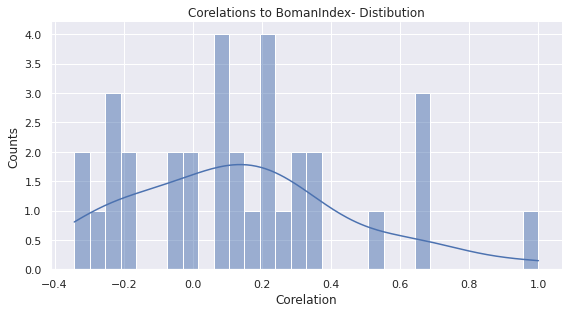

In [34]:
cols = prep.get_cechy(analysis.normalized_df)# analysis.normalized_df.describe().columns
indx = list(i for i in range(len(cols)) if cols[i]=='BomanIndex')[0]
corls = prep.correlation(analysis.normalized_df)
sns.set(font_scale=1)
dplot = sns.displot(corls[12,:], kde=True, bins=30, height=4, aspect=2)
dplot.set_xlabels('Corelation')
dplot.set_ylabels('Counts')
plt.title('Corelations to BomanIndex- Distibution')
dplot

(                     Cysteines  Asphartic Acid  Small_aminoacids  Aliphatic  \
 Cysteines             1.000000       -0.014953         -0.343258  -0.525243   
 Asphartic Acid       -0.014953        1.000000         -0.178153  -0.170777   
 Small_aminoacids     -0.343258       -0.178153          1.000000   0.497165   
 Aliphatic            -0.525243       -0.170777          0.497165   1.000000   
 Aromatic             -0.054395       -0.087400         -0.227699  -0.337171   
 NonPolar             -0.072462       -0.371125          0.554286   0.548833   
 Polar                 0.073478        0.371769         -0.554847  -0.548453   
 Charged              -0.075198        0.406212         -0.385959  -0.355805   
 Basic                -0.071299       -0.051770         -0.284970  -0.247412   
 Acidic               -0.028929        0.761399         -0.260636  -0.261455   
 Hydrophobic_residue  -0.572946       -0.275785          0.661629   0.787611   
 Length                0.160463        0

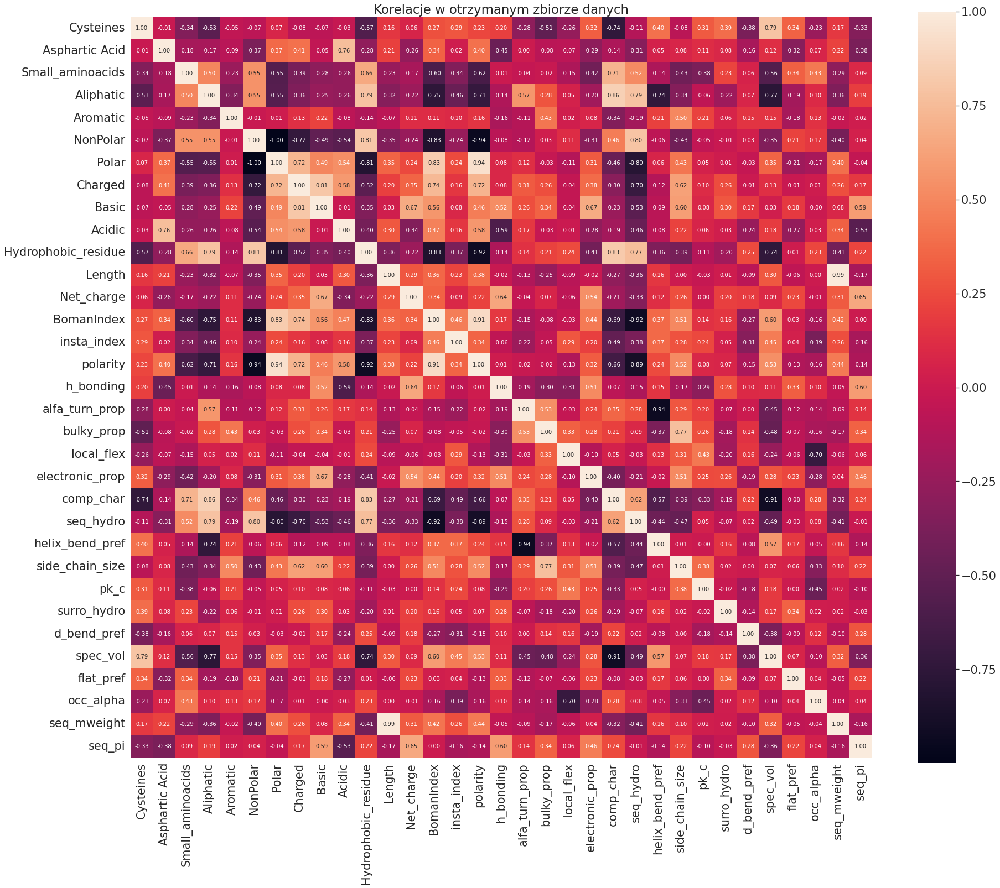

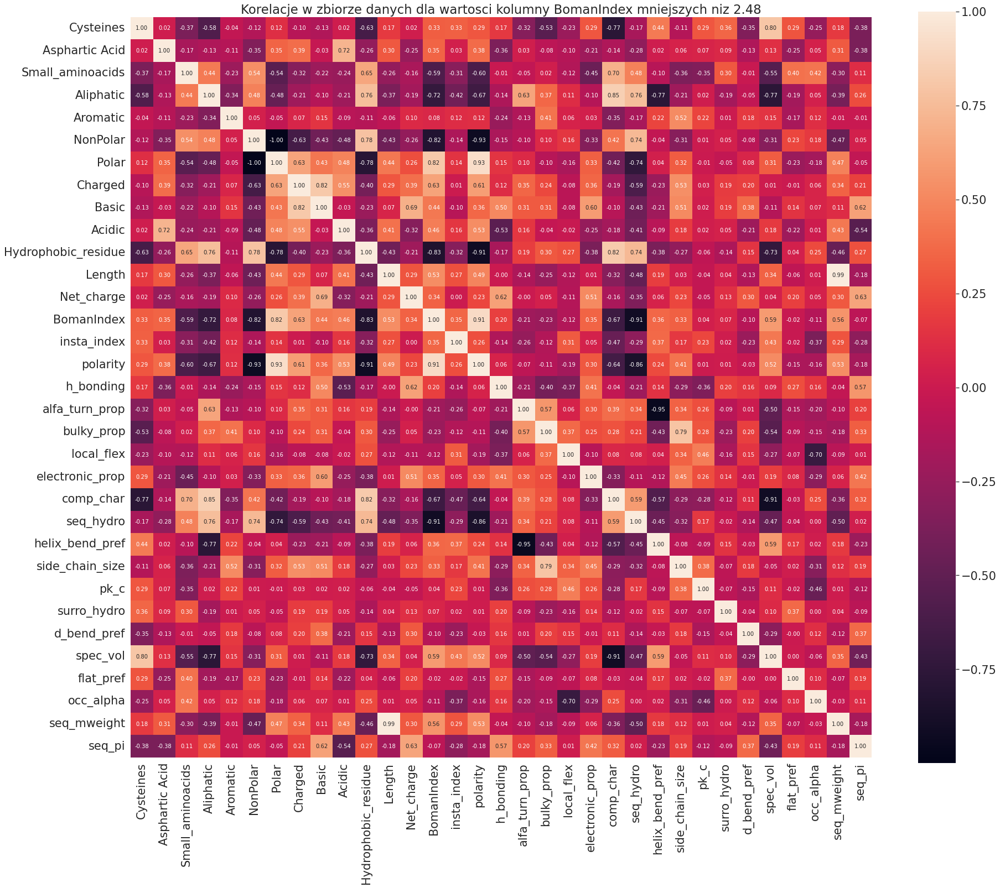

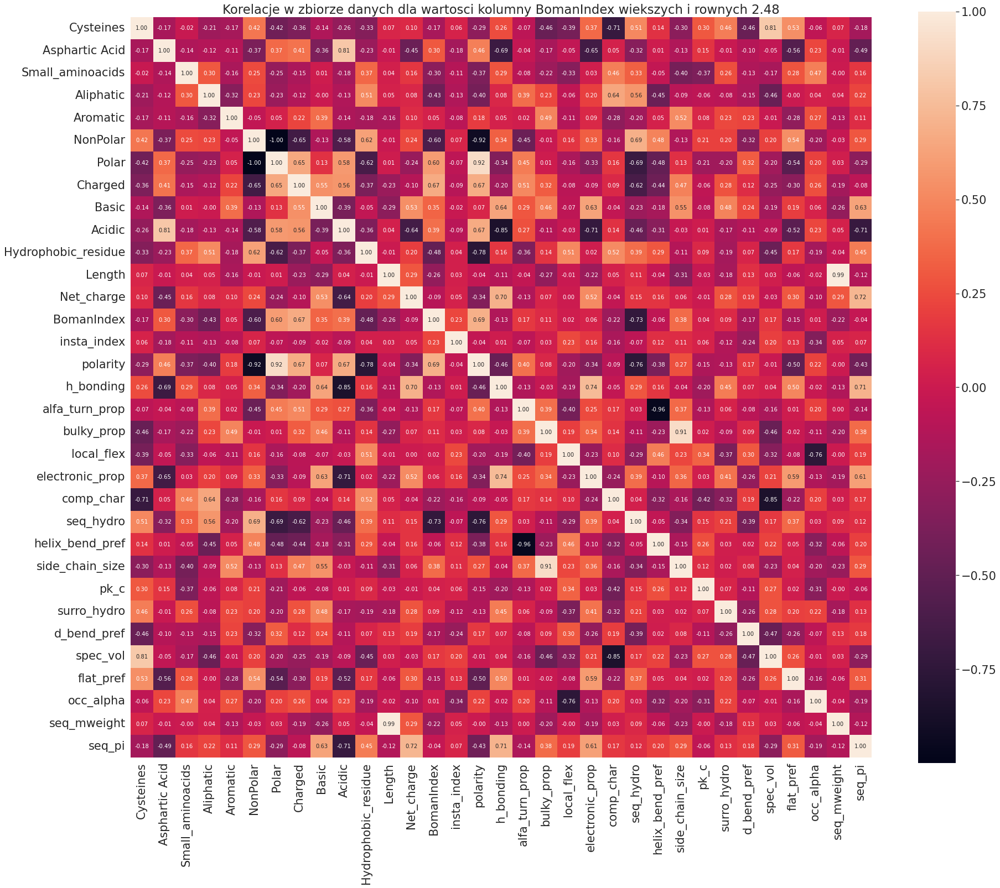

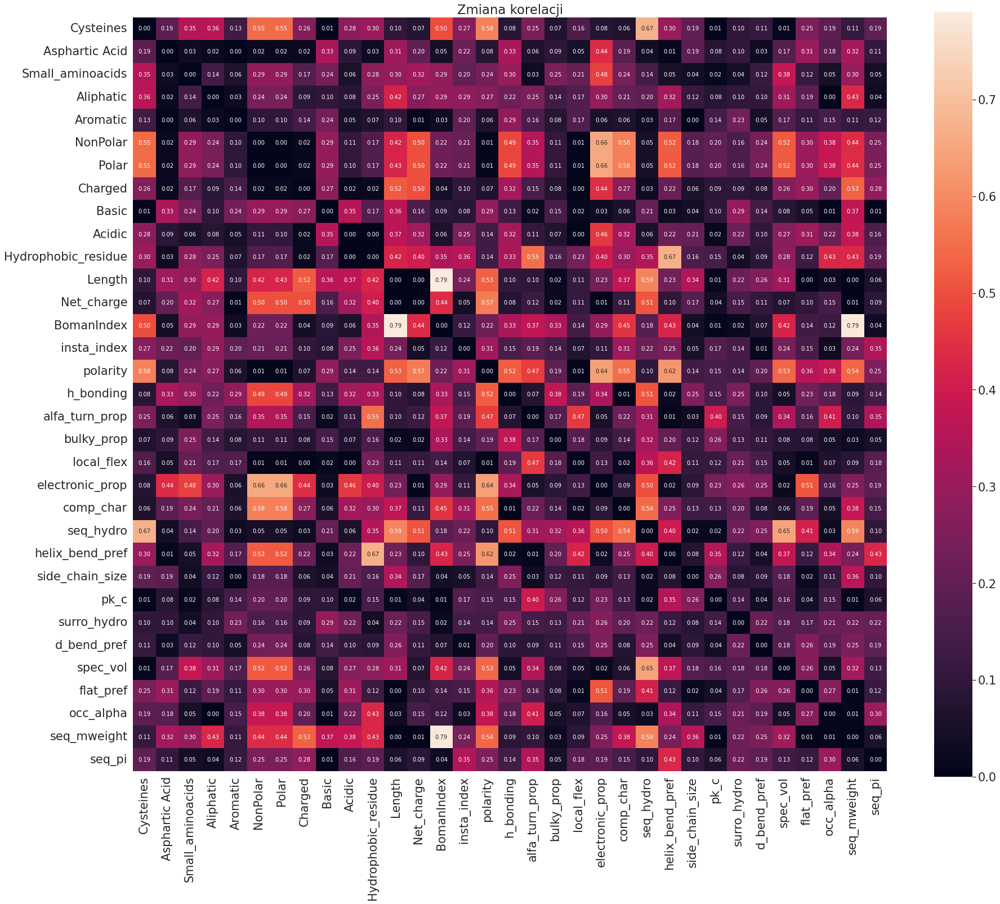

In [5]:
tytuly = [
        'Korelacje w otrzymanym zbiorze danych',
        'Korelacje w zbiorze danych dla wartosci kolumny BomanIndex mniejszych niz 2.48',
        'Korelacje w zbiorze danych dla wartosci kolumny BomanIndex wiekszych i rownych 2.48',
        'Zmiana korelacji',
    ]
analysis.corelations_presentation(analysis.normalized_df, analysis.name_column, 2.48, True, True, False, tytuly)

In [11]:
cechy = prep.get_cechy(analysis.normalized_df)
ML_df = analysis.normalized_df[cechy]
X_test, y_test, X_train, y_train = machinelern.train_test_split_feature_select(df=ML_df, 
                                                                               train_size=0.2,
                                                                               r_state=1,
                                                                               feature_select='SelectKBest',
                                                                               n_feature=14,
                                                                               normalizzation=True
                                                                              )
test_df = pd.concat([y_test, X_test], axis=1)
train_df = pd.concat([y_train, X_train], axis=1)
print(len(test_df), len(train_df))


5173 1293


In [12]:
#Kologomorow test do sprawdzenia czy czesci zbioru maja rozklad normalny
test_kolo = pd.DataFrame(dict(map(lambda x: (x,stats.kstest(X_test[x], stats.norm.cdf, alternative='less')), prep.get_cechy(X_test))), index=['statistic', 'pvalue']).T
test_kolo.to_excel('./databases/wyniki/testowy_kologomorow.xlsx')
test_kolo

,statistic,pvalue
Aliphatic,0.299492,0.000000e+00
NonPolar,0.267074,0.000000e+00
Polar,0.269612,0.000000e+00
Charged,0.240324,9.876842e-264
Basic,0.184996,9.735298e-156
Hydrophobic_residue,0.237002,2.037775e-256
insta_index,0.292706,0.000000e+00
polarity,0.166411,5.631961e-126
electronic_prop,0.212583,6.324965e-206
comp_char,0.132996,1.492844e-80


In [13]:
tytuly = [
    'Korelacje uzyskanego zbioru testowego',
    'Korelacje w zbiorze testowym dla BomanIndexu ponizej 2.48',
    'Korelacje w zbiorze testowym dla BomanIndexu powyzej 2.48',
    'Zmiana korelacji w zbiorze testowym'
]

testowy = analysis.corelations_presentation(test_df, analysis.name_column, 0.8, False, False, True, tytuly)
testowy

(                     BomanIndex  Aliphatic  NonPolar     Polar   Charged  \
 BomanIndex             1.000000  -0.408649 -0.467380  0.467508  0.494676   
 Aliphatic             -0.408649   1.000000  0.556118 -0.555618 -0.355687   
 NonPolar              -0.467380   0.556118  1.000000 -0.999411 -0.716092   
 Polar                  0.467508  -0.555618 -0.999411  1.000000  0.716258   
 Charged                0.494676  -0.355687 -0.716092  0.716258  1.000000   
 Basic                  0.426764  -0.245582 -0.493968  0.493511  0.812897   
 Hydrophobic_residue   -0.432842   0.792930  0.806039 -0.806414 -0.517808   
 insta_index            0.345694  -0.458801 -0.243819  0.243783  0.154613   
 polarity               0.518973  -0.715345 -0.940794  0.941342  0.713367   
 electronic_prop        0.387522  -0.209952 -0.312850  0.313725  0.389153   
 comp_char             -0.371384   0.860714  0.455533 -0.456394 -0.300568   
 seq_hydro             -0.537916   0.785699  0.801338 -0.800863 -0.705106   

In [14]:
uczacy_kolo = pd.DataFrame(dict(map(lambda x: (x,stats.kstest(X_train[x], stats.norm.cdf, alternative='less')), prep.get_cechy(X_train))), index=['statistic', 'pvalue']).T
uczacy_kolo.to_excel('./databases/wyniki/uczacy_kologomorow.xlsx')
uczacy_kolo

,statistic,pvalue
Aliphatic,0.301982,2.125297e-105
NonPolar,0.251844,4.644126e-73
Polar,0.265639,2.479604e-81
Charged,0.237982,3.227050e-65
Basic,0.185342,1.182216e-39
Hydrophobic_residue,0.237204,8.617733e-65
insta_index,0.281316,2.631591e-91
polarity,0.171249,6.333561e-34
electronic_prop,0.211708,1.247956e-51
comp_char,0.137489,4.402462e-22


(                     BomanIndex  Aliphatic  NonPolar     Polar   Charged  \
 BomanIndex             1.000000  -0.403896 -0.471841  0.472776  0.506934   
 Aliphatic             -0.403896   1.000000  0.519860 -0.519929 -0.356214   
 NonPolar              -0.471841   0.519860  1.000000 -0.999707 -0.733780   
 Polar                  0.472776  -0.519929 -0.999707  1.000000  0.734650   
 Charged                0.506934  -0.356214 -0.733780  0.734650  1.000000   
 Basic                  0.430422  -0.255356 -0.495426  0.495970  0.790439   
 Hydrophobic_residue   -0.444723   0.766297  0.808700 -0.808513 -0.531645   
 insta_index            0.349145  -0.447437 -0.240709  0.241811  0.181467   
 polarity               0.518329  -0.695797 -0.938350  0.938713  0.722279   
 electronic_prop        0.362874  -0.166968 -0.306931  0.306833  0.339896   
 comp_char             -0.383286   0.846328  0.461233 -0.461535 -0.321493   
 seq_hydro             -0.523191   0.794560  0.771353 -0.772077 -0.691609   

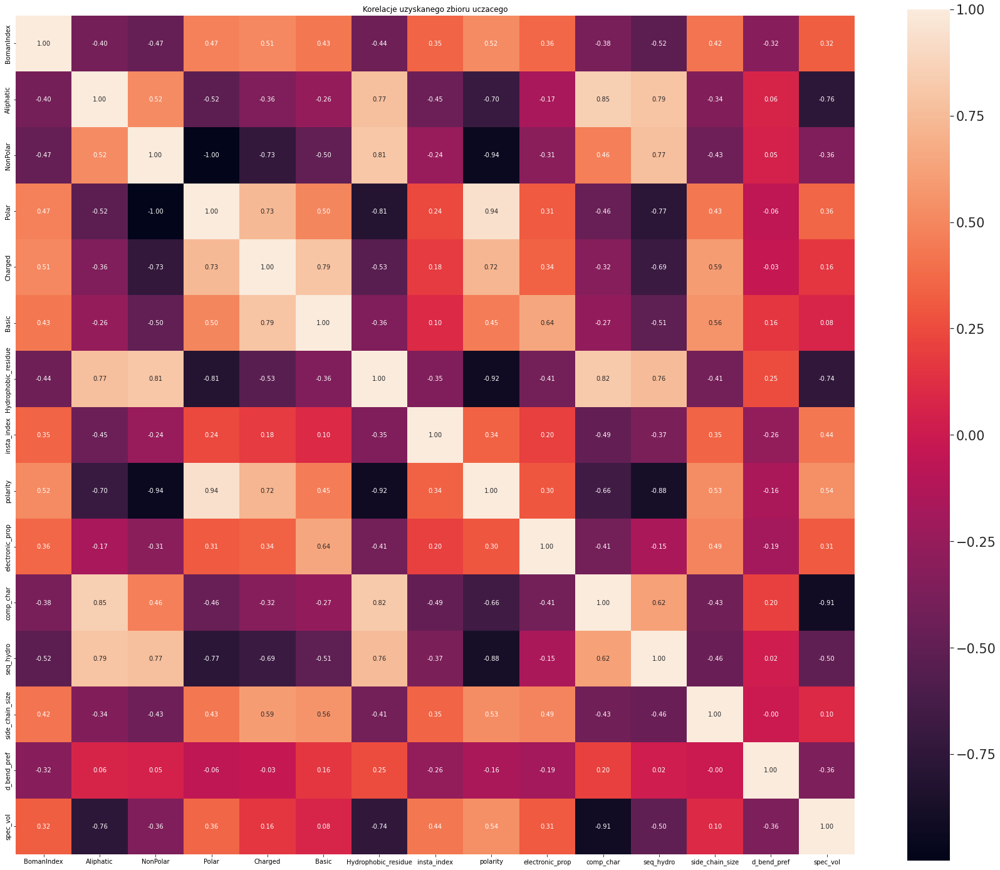

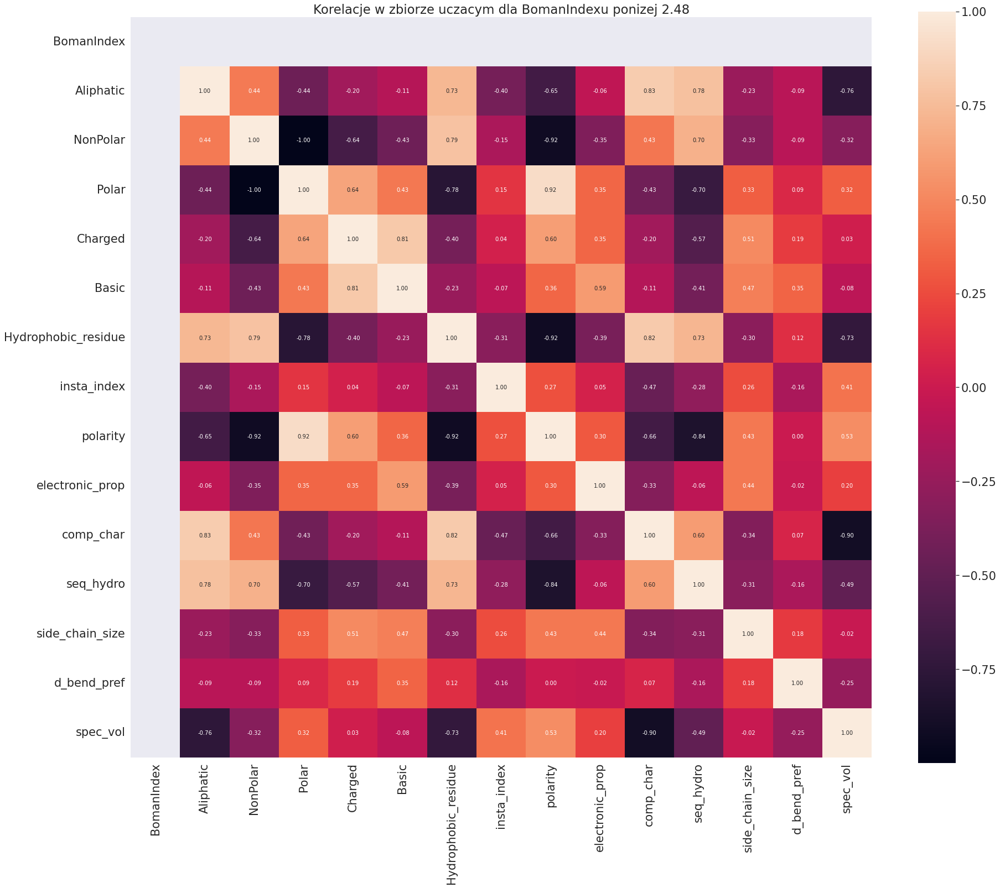

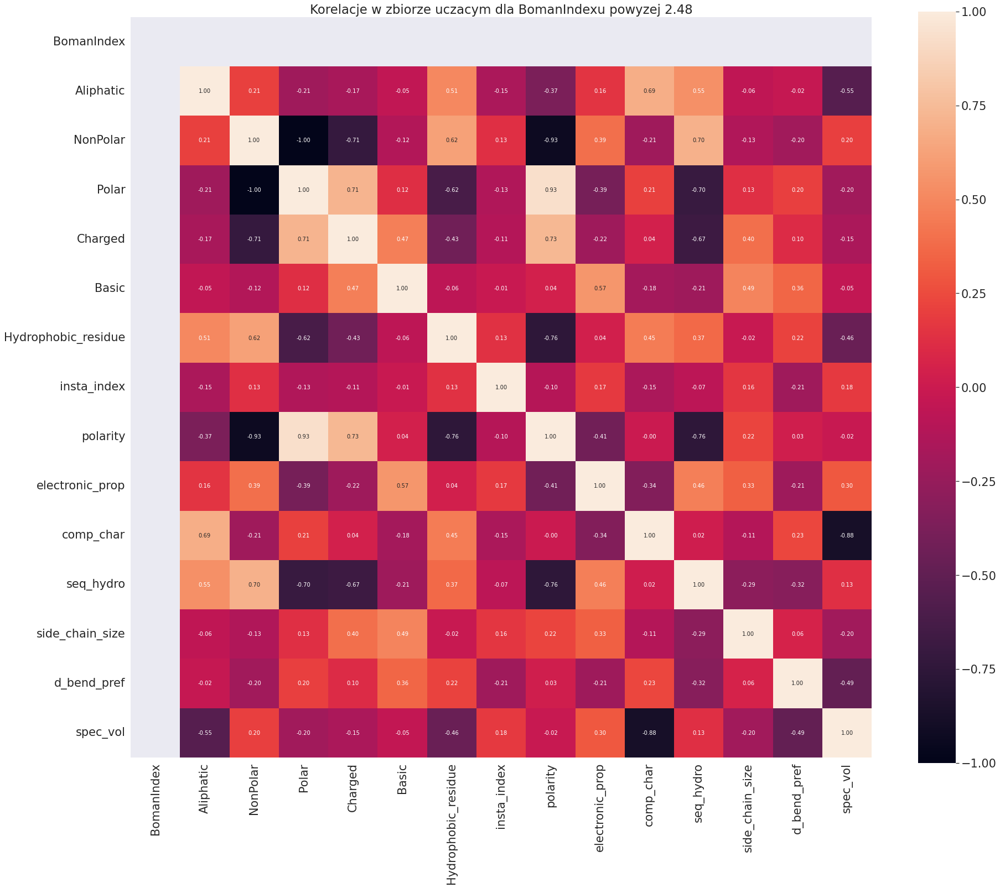

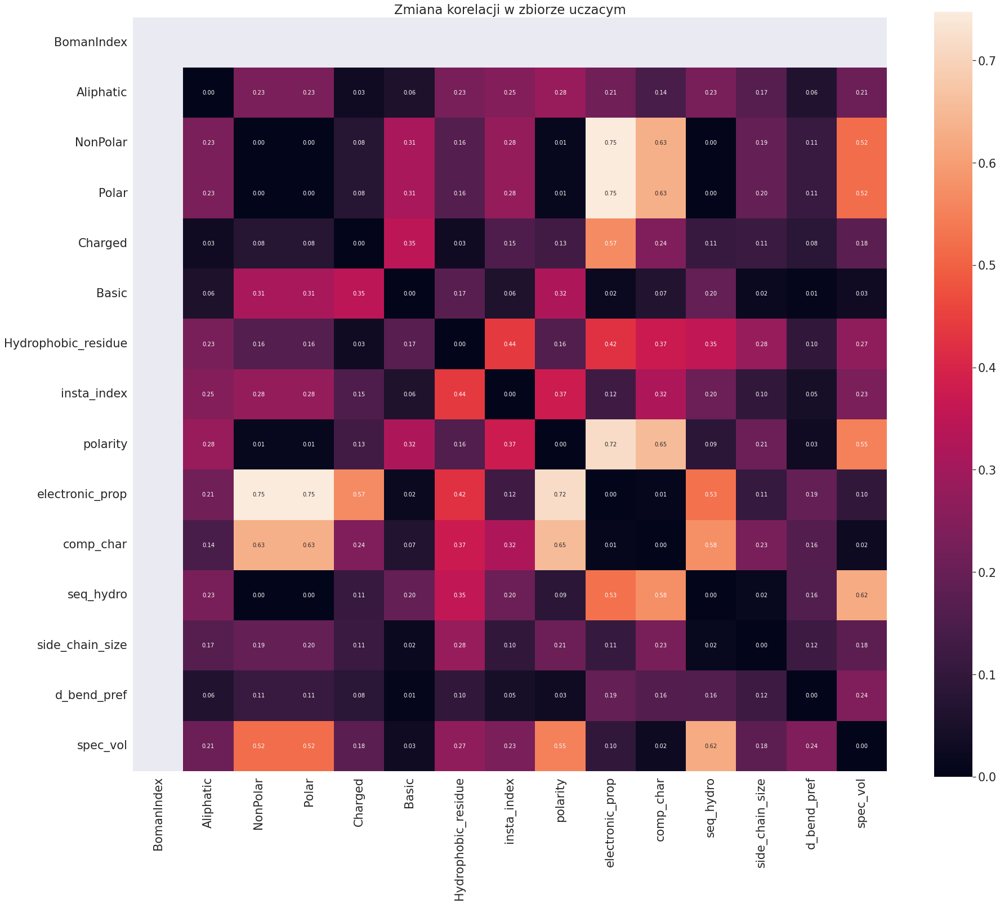

In [15]:
tytuly = [
    'Korelacje uzyskanego zbioru uczacego',
    'Korelacje w zbiorze uczacym dla BomanIndexu ponizej 2.48',
    'Korelacje w zbiorze uczacym dla BomanIndexu powyzej 2.48',
    'Zmiana korelacji w zbiorze uczacym'
]
analysis.corelations_presentation(train_df, analysis.name_column, 0.8, True, True, True, tytuly)


['Cysteines', 'Asphartic Acid', 'Small_aminoacids', 'Aliphatic', 'Aromatic', 'NonPolar']
['Polar', 'Charged', 'Basic', 'Acidic', 'Hydrophobic_residue', 'Length']
['Net_charge', 'BomanIndex', 'insta_index', 'polarity', 'h_bonding', 'alfa_turn_prop']
['bulky_prop', 'local_flex', 'electronic_prop', 'comp_char', 'seq_hydro', 'helix_bend_pref']
['side_chain_size', 'pk_c', 'surro_hydro', 'd_bend_pref', 'spec_vol', 'flat_pref']
['occ_alpha', 'seq_mweight', 'seq_pi']


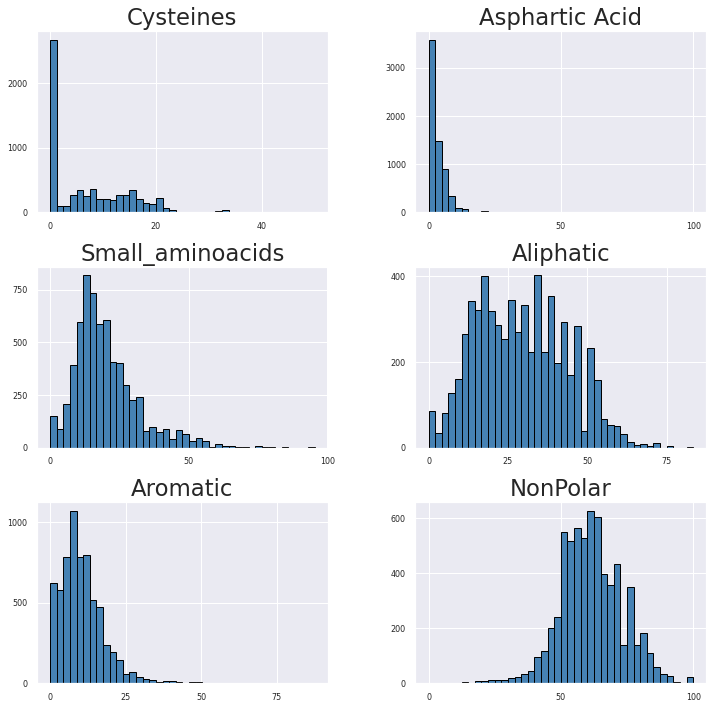

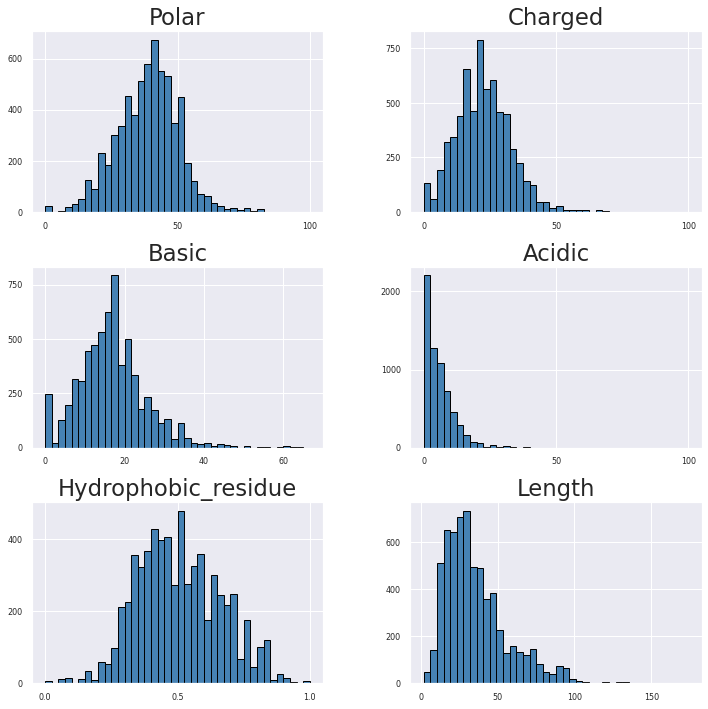

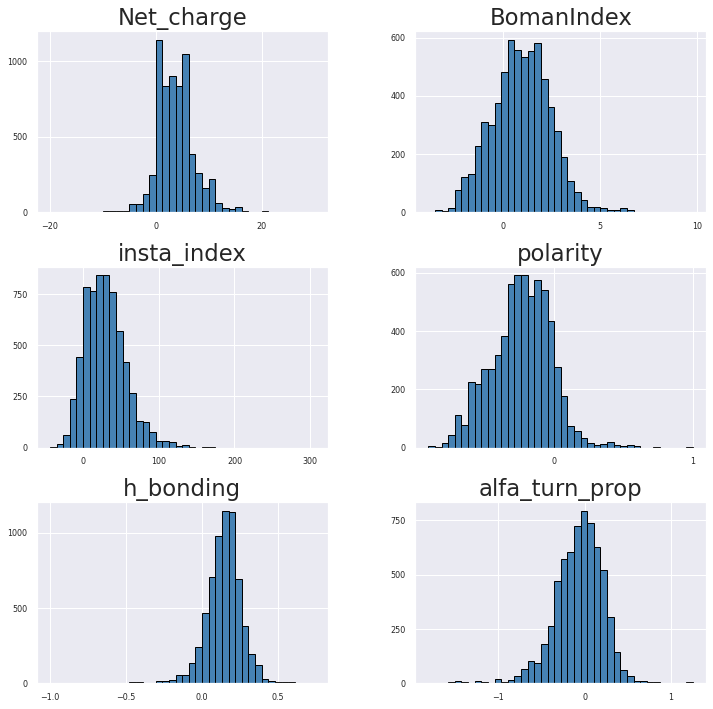

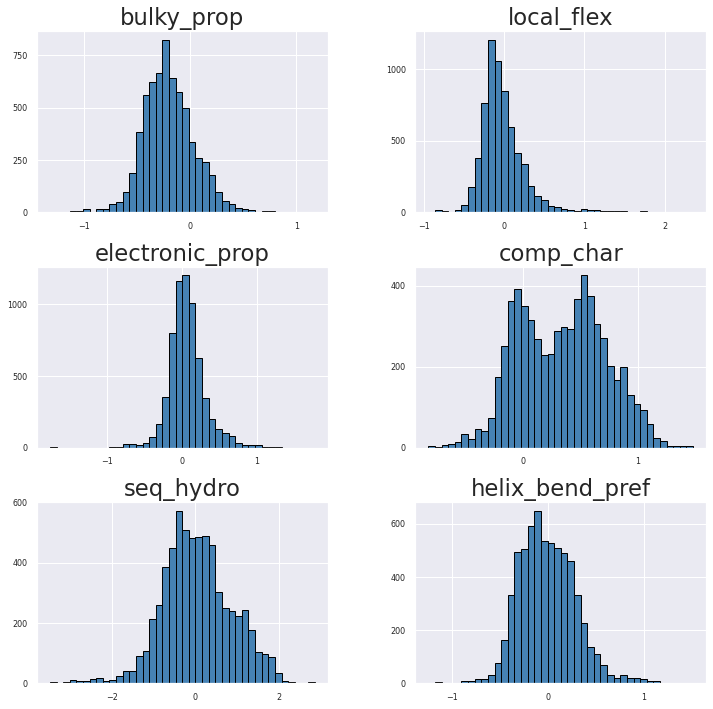

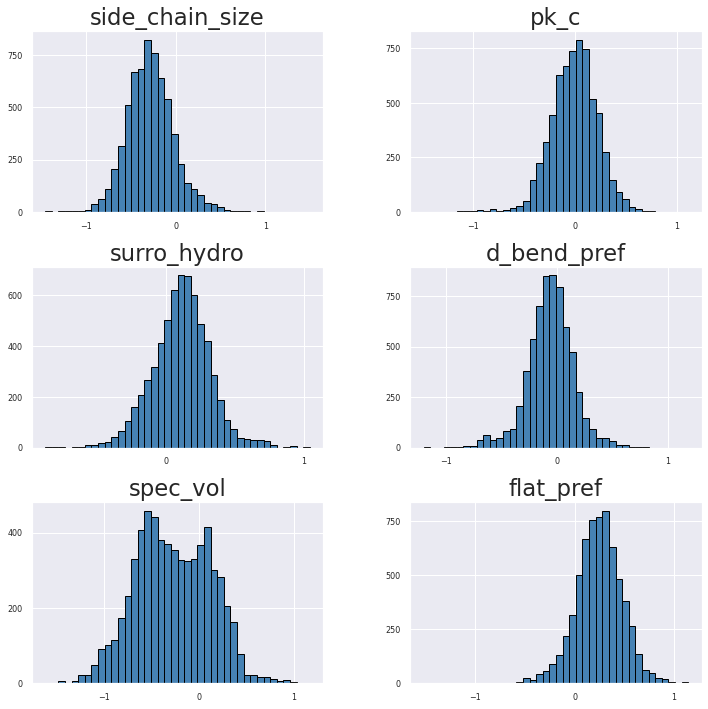

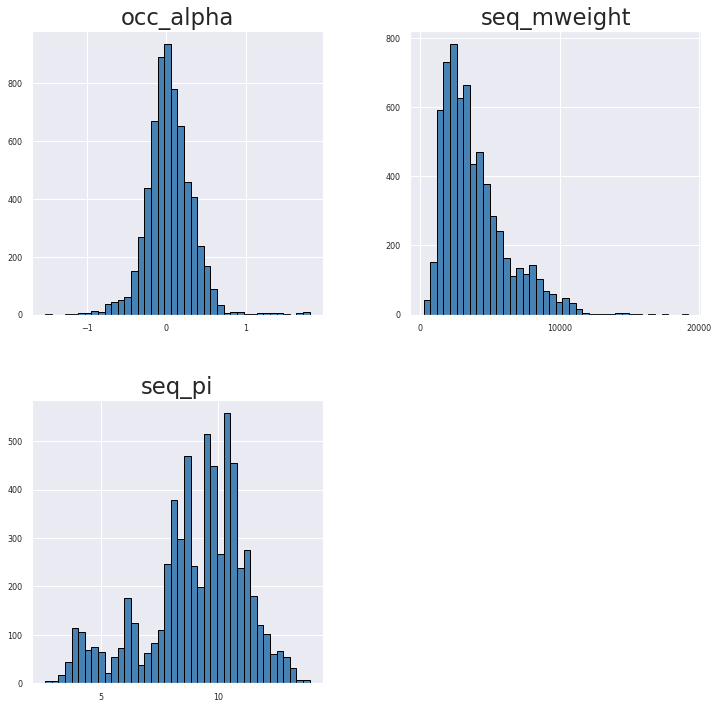

In [16]:
i=0
while i <= len(ML_df.columns):
        j=i
        i+=6
        current = list(ML_df.columns[z] for z in range(j, i) if z <= len(ML_df.columns)-1)
        print(current)
        ML_df.hist(column=current,
                   bins=40, 
                   color='steelblue', 
                   edgecolor='black', 
                   figsize=[12, 12], 
                   linewidth=1.0, 
                   xlabelsize=8,
                   ylabelsize=8, 
                   grid=True)  
        plt.savefig(f'./figures/histogram{j,i}')